<a href="https://colab.research.google.com/github/antahiap/dsr-image-dataset-curation/blob/main/notebooks/Tutorial_Part1_Downloading_Images_to_Google_Drive_and_Creating_Embeddings.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Tutorial - Downloading Images to Google Drive and Creating Embeddings
#### Author: Antonio Rueda-Toicen
#### [Berlin Computer Vision Group](https://www.meetup.com/berlin-computer-vision-group/)

**antonio.rueda.toicen 'at' gmail 'dot' com**

[![Creative Commons License](https://i.creativecommons.org/l/by/4.0/88x31.png)](http://creativecommons.org/licenses/by/4.0/)

This work is licensed under a [Creative Commons Attribution 4.0 International License](http://creativecommons.org/licenses/by/4.0/).

## Downloading Paintings to Google Drive and Creating Image Embeddings

In this notebook, we will explore the process of downloading paintings from the web and converting them into numerical representations known as embeddings. These embeddings can be used in various machine learning tasks such as similarity search, clustering, and more. We'll break down the process into several steps, explaining each part in detail.

This tutorial is part 1 of a series on image similarity.

To create your own `urls.txt` file with the image addresses, please follow [this tutorial by Adrian Rosebrock](https://pyimagesearch.com/2018/04/09/how-to-quickly-build-a-deep-learning-image-dataset/).

The image scraping script from this tutorial can be found [here](https://github.com/andandandand/image-dataset-curation/blob/main/google_images_scrapper.js) and the `urls.txt` file [here](https://github.com/andandandand/image-dataset-curation/blob/main/urls.txt).
The folder with the downloaded images is available [here](https://drive.google.com/drive/folders/1l7VvTnRwWpo4_wPPMrUcmMtKeaxuFTfY?usp=drive_link).
Right click on the folder name and select "Add Shortcut to Drive" in order to add to your own Drive.


### 1. Importing Image Libraries

We'll start by importing the necessary libraries that will help us in manipulating images and working with images.

In [ ]:
import skimage.io as io
from PIL import Image

img_array =io.imread("https://media.npr.org/assets/img/2021/09/07/gettyimages-1338045034-60e29e617bd5292c689bc04348848760a7f52042.jpg")
img_array.shape

(2131, 2841, 3)

### 2. Loading an Image

Here, we'll load an image from an array and convert it into a format suitable for further processing.

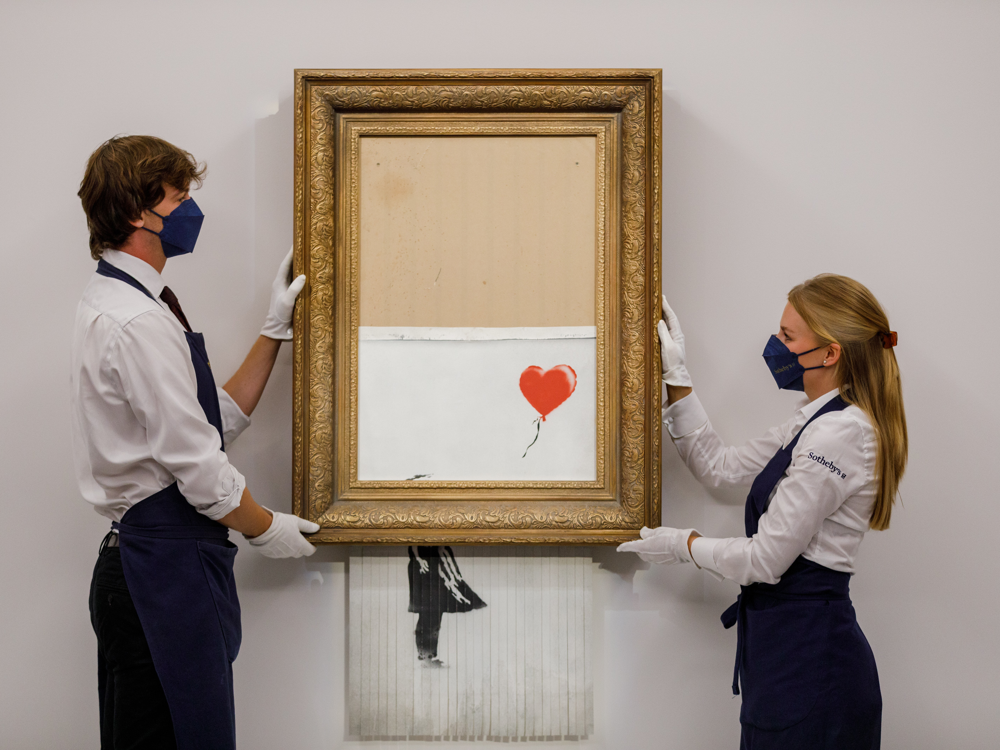

In [ ]:
image = Image.fromarray(img_array)
image

### 3. Defining and Initializing Image Embedding Model

We will define a model (Img2Vec) that can convert images into numerical vectors called embeddings. This model is then initialized for usage. **Don't worry about the details of this model.** For now, you can treat it as a black box that turns images into vectors of numbers. Similar images will turn into vectors that are close to each other.

In [ ]:
# https://github.com/christiansafka/img2vec
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
import numpy as np

class Img2Vec():
    RESNET_OUTPUT_SIZES = {
        'resnet18': 512,
        'resnet34': 512,
        'resnet50': 2048,
        'resnet101': 2048,
        'resnet152': 2048,
    }

    def __init__(self, cuda=False, model='resnet-34', layer='default',
                 layer_output_size=512):
        """ Img2Vec
        :param cuda: If set to True, will run forward pass on GPU
        :param model: String name of requested model
        :param layer: String or Int depending on model.  See more docs: https://github.com/christiansafka/img2vec.git
        :param layer_output_size: Int depicting the output size of the requested layer
        """
        self.device = torch.device("cuda" if cuda else "cpu")
        self.layer_output_size = layer_output_size
        self.model_name = model

        self.model, self.extraction_layer = self._get_model_and_layer(model, layer)

        self.model = self.model.to(self.device)

        self.model.eval()

        self.scaler = transforms.Resize((224, 224))
        self.normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                              std=[0.229, 0.224, 0.225])
        self.to_tensor = transforms.ToTensor()

    def get_vec(self, img, tensor=False):
        """ Get vector embedding from PIL image
        :param img: PIL Image or list of PIL Images
        :param tensor: If True, get_vec will return a FloatTensor instead of Numpy array
        :returns: Numpy ndarray
        """
        if type(img) == list:
            a = [self.normalize(self.to_tensor(self.scaler(im))) for im in img]
            images = torch.stack(a).to(self.device)
            if self.model_name == 'alexnet':
                my_embedding = torch.zeros(len(img), self.layer_output_size)
            else:
                my_embedding = torch.zeros(len(img), self.layer_output_size, 1, 1)

            def copy_data(m, i, o):
                my_embedding.copy_(o.data)

            h = self.extraction_layer.register_forward_hook(copy_data)
            h_x = self.model(images)
            h.remove()

            if tensor:
                return my_embedding
            else:
                if self.model_name == 'alexnet':
                    return my_embedding.numpy()[:, :]
                else:
                    return my_embedding.numpy()[:, :, 0, 0]
        else:
            image = self.normalize(self.to_tensor(self.scaler(img))).unsqueeze(0).to(self.device)

            if self.model_name == 'alexnet':
                my_embedding = torch.zeros(1, self.layer_output_size)
            else:
                my_embedding = torch.zeros(1, self.layer_output_size, 1, 1)

            def copy_data(m, i, o):
                my_embedding.copy_(o.data)

            h = self.extraction_layer.register_forward_hook(copy_data)
            h_x = self.model(image)
            h.remove()

            if tensor:
                return my_embedding
            else:
                if self.model_name == 'alexnet':
                    return my_embedding.numpy()[0, :]
                else:
                    return my_embedding.numpy()[0, :, 0, 0]

    def _get_model_and_layer(self, model_name, layer):
        """ Internal method for getting layer from model
        :param model_name: model name such as 'resnet-18'
        :param layer: layer as a string for resnet-18 or int for alexnet
        :returns: pytorch model, selected layer
        """

        if model_name.startswith('resnet') and not model_name.startswith('resnet-'):
            model = getattr(models, model_name)(pretrained=True)
            if layer == 'default':
                layer = model._modules.get('avgpool')
                self.layer_output_size = self.RESNET_OUTPUT_SIZES[model_name]
            else:
                layer = model._modules.get(layer)
            return model, layer
        elif model_name == 'resnet-34':
            model = models.resnet34(pretrained=True)
            if layer == 'default':
                layer = model._modules.get('avgpool')
                self.layer_output_size = 512
            else:
                layer = model._modules.get(layer)

            return model, layer

        elif model_name == 'alexnet':
            model = models.alexnet(pretrained=True)
            if layer == 'default':
                layer = model.classifier[-2]
                self.layer_output_size = 4096
            else:
                layer = model.classifier[-layer]

            return model, layer

        else:
            raise KeyError('Model %s was not found' % model_name)

### 4. Mounting Google Drive

This part of the code is responsible for mounting Google Drive, allowing us to access files stored there.

In [ ]:
from google.colab import drive
drive.mount('/gdrive')

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).


### 5. Setting Up Paths

We define the paths where the images and other related data are located. This helps in organizing and accessing the files easily.

In [ ]:
from pathlib import Path
import os
path = Path('/gdrive/MyDrive/art_recommendation/banksy')
# here urls.txt should appear
os.listdir(path)

['urls.txt', 'paintings', 'paintings_embeddings.pickle']

### 6. Saving Images

This section shows how to save an image to a specific location on the drive.

In [ ]:
filename1 = path/'paintings/banksy_1.jpg'
image.save(filename1)

### 7. Creating Image Embeddings

Here, we use the initialized model to convert an image into an embedding. This numerical representation can be used for various purposes in machine learning.

In [ ]:
embedding1 = img2vec.get_vec(image)
embedding1

array([5.49497008e-01, 6.92683011e-02, 1.65893555e-01, 1.01826584e+00,
       8.41520652e-02, 8.20981264e-01, 2.39887500e+00, 4.69917953e-01,
       4.84077364e-01, 1.11906254e+00, 1.38753748e+00, 3.95559460e-01,
       1.64112794e+00, 3.95849735e-01, 1.73569158e-01, 3.12550455e-01,
       9.16559845e-02, 9.74714935e-01, 3.63302976e-01, 1.26961017e+00,
       2.52024245e+00, 3.77506137e+00, 4.22364283e+00, 9.67142761e-01,
       1.07083142e+00, 5.35881817e-01, 7.34870374e-01, 1.36189508e+00,
       1.03011274e+00, 3.47854316e-01, 5.25455058e-01, 1.05929089e+00,
       5.42197078e-02, 1.10966480e+00, 3.14985013e+00, 2.39535645e-01,
       5.90905212e-02, 7.84693956e-01, 0.00000000e+00, 7.81413496e-01,
       1.31900704e+00, 8.08174536e-03, 1.54126418e+00, 1.39548492e+00,
       3.72316897e-01, 9.17652369e-01, 9.28848445e-01, 5.70088029e-01,
       5.19288838e-01, 1.06125191e-01, 4.40444857e-01, 4.98390198e-01,
       4.42162752e-01, 1.35256183e+00, 6.42456532e-01, 2.68805683e-01,
      

In [ ]:
# Now we put the image embedding into a dictionary with the filename as key
paintings_embedded_dict = {filename1:embedding1}

### 8. Reading Image URLs

This section reads a list of image URLs from a file. These URLs will be used to download the images.

In [ ]:
with open(path / 'urls.txt', 'r') as f:
   # https://stackoverflow.com/a/12330535/45963
  image_urls = f.read().splitlines()

### 9. Downloading Images with `skimage.io.imread()`

We loop through the URLs and download each image, handling exceptions if any issues arise during the download.

In [ ]:
for index, url in enumerate(image_urls):
  try:
   #import pdb; pdb.set_trace()
   image = Image.fromarray(io.imread(url)[:,:,:3])
   filename = path/'paintings'/f'banksy_0{index}.jpg'
   image.save(filename)
   embedding = img2vec.get_vec(image)
   paintings_embedded_dict[filename] = embedding
   #comment out the break line to get the file
   #break
  except:
    continue

/usr/local/lib/python3.10/dist-packages/PIL/TiffImagePlugin.py:858: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 2. 
  warnings.warn(str(msg))


### 10. Saving Embeddings

Once the images are converted into embeddings, we save them to a file for future use.

In [ ]:
# check out the integrity of our pickle file
import pickle
with open(path / 'paintings_embeddings.pickle', 'wb') as handle:
    pickle.dump(paintings_embedded_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

with open(path / 'paintings_embeddings.pickle', 'rb') as handle:
    b = pickle.load(handle)

assert len(b.keys()) == len(paintings_embedded_dict.keys())

### 11. Checking the Format of the Keys in Our Dictionary
Each key in our dictionary should have the [**full path**](https://courses.cs.washington.edu/courses/cse140/13wi/file-interaction.html#:~:text=Absolute%20and%20Relative%20file%20paths&text=An%20absolute%20file%20path%20describes,For%20example%2C%20example_directory.), not the relative path to the images. We can check this by inspecting the filenames and using `Image.open()`.

In [ ]:
# These should be fully formed paths, we should be able to open all of these images
# from Google Drive
b.keys()

dict_keys([PosixPath('/gdrive/MyDrive/art_recommendation/banksy/paintings/banksy_1.jpg'), PosixPath('/gdrive/MyDrive/art_recommendation/banksy/paintings/banksy_02.jpg'), PosixPath('/gdrive/MyDrive/art_recommendation/banksy/paintings/banksy_04.jpg'), PosixPath('/gdrive/MyDrive/art_recommendation/banksy/paintings/banksy_05.jpg'), PosixPath('/gdrive/MyDrive/art_recommendation/banksy/paintings/banksy_06.jpg'), PosixPath('/gdrive/MyDrive/art_recommendation/banksy/paintings/banksy_07.jpg'), PosixPath('/gdrive/MyDrive/art_recommendation/banksy/paintings/banksy_08.jpg'), PosixPath('/gdrive/MyDrive/art_recommendation/banksy/paintings/banksy_09.jpg'), PosixPath('/gdrive/MyDrive/art_recommendation/banksy/paintings/banksy_010.jpg'), PosixPath('/gdrive/MyDrive/art_recommendation/banksy/paintings/banksy_011.jpg'), PosixPath('/gdrive/MyDrive/art_recommendation/banksy/paintings/banksy_012.jpg'), PosixPath('/gdrive/MyDrive/art_recommendation/banksy/paintings/banksy_013.jpg'), PosixPath('/gdrive/MyDrive

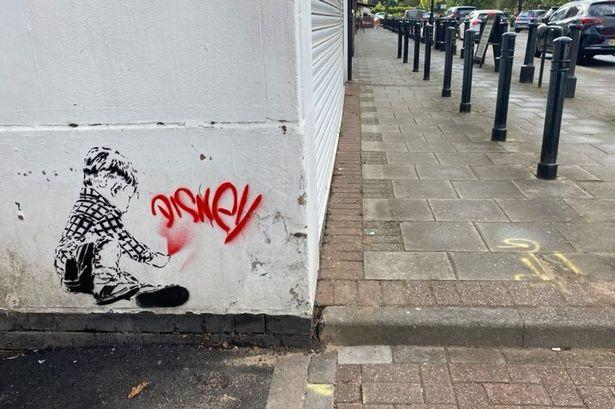

In [ ]:
# Check that the keys correspond to valid paths
Image.open(list(b.keys())[-1])

## References

* Christian Safka's [img2vec repository](https://github.com/christiansafka/img2vec)
* Adrian Rosebrok's [guide on downloading from Google Images](https://pyimagesearch.com/2018/04/09/how-to-quickly-build-a-deep-learning-image-dataset/)